In [1]:
#import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import time
import random
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.figure_factory as ff
from iso639 import languages
import user_agents
from ip2geotools.databases.noncommercial import DbIpCity as ip2geo
import requests
import json
from geopy.distance import great_circle
from geopy.geocoders import Nominatim
from datasist.structdata import detect_outliers
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from sklearn.preprocessing import OneHotEncoder
from category_encoders import BinaryEncoder 
from datetime import datetime
from sklearn.model_selection import train_test_split
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler 
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import accuracy_score
from imblearn.over_sampling import SMOTE
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import r2_score , mean_squared_error , classification_report ,recall_score , precision_score , ConfusionMatrixDisplay , confusion_matrix
from sklearn.linear_model import Ridge , Lasso
from sklearn.tree import DecisionTreeRegressor , DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.ensemble import RandomForestRegressor , RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB , GaussianNB , BernoulliNB
from sklearn.svm import SVC , SVR
from sklearn.ensemble import AdaBoostClassifier , GradientBoostingClassifier
import xgboost as xgb
%matplotlib inline


In [2]:
#import data
df=pd.read_csv('Employees Promotion.csv')
df.sample(5)

,EmployeeID,Department,Region_Employment,Education Level,Gender,Recruitment Channel,NO_Trainings_LstYear,Age,previous_year_rating,Service Length,Awards,Avg_Training_Score,Is Promoted
44867,28182,Sales & Marketing,8,Bachelor's,m,other,1,31.0,4.0,5,NO,53.0,NO
27742,5788,Operations,15,Bachelor's,m,sourcing,1,38.0,3.0,9,NO,57.0,NO
24373,32468,Technology,2,Bachelor's,f,other,1,29.0,3.0,4,NO,80.0,NO
37326,60966,Technology,15,Bachelor's,m,NaN,1,43.0,3.0,11,NO,76.0,NO
15059,4018,Operations,31,Bachelor's,m,other,1,27.0,5.0,1,NO,62.0,NO


In [3]:
#cleansing
#investing
df.shape

(54808, 13)

In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
EmployeeID,54808.0,39195.830627,22586.581449,1.0,19669.75,39225.5,58730.5,78298.0
Region_Employment,54808.0,14.195045,10.086273,1.0,4.00,13.0,22.0,34.0
NO_Trainings_LstYear,54808.0,1.253011,0.609264,1.0,1.00,1.0,1.0,10.0
Age,54268.0,34.586644,8.114136,0.0,29.00,33.0,39.0,60.0
previous_year_rating,50684.0,3.329256,1.259993,1.0,3.00,3.0,4.0,5.0
Service Length,54808.0,5.865512,4.265094,1.0,3.00,5.0,7.0,37.0
Avg_Training_Score,52248.0,63.712238,13.521910,39.0,51.00,60.0,77.0,99.0


In [5]:
df.describe(include='O').T

,count,unique,top,freq
Department,54808,10,Sales & Marketing,16773
Education Level,52399,3,Bachelor's,36669
Gender,54808,2,m,38496
Recruitment Channel,44404,3,other,24672
Awards,54808,2,NO,53538
Is Promoted,54808,2,NO,50140


In [6]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
EmployeeID,54808.0,NaN,NaN,NaN,39195.830627,22586.581449,1.0,19669.75,39225.5,58730.5,78298.0
Department,54808,10,Sales & Marketing,16773,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Region_Employment,54808.0,NaN,NaN,NaN,14.195045,10.086273,1.0,4.0,13.0,22.0,34.0
Education Level,52399,3,Bachelor's,36669,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,54808,2,m,38496,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Recruitment Channel,44404,3,other,24672,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NO_Trainings_LstYear,54808.0,NaN,NaN,NaN,1.253011,0.609264,1.0,1.0,1.0,1.0,10.0
Age,54268.0,NaN,NaN,NaN,34.586644,8.114136,0.0,29.0,33.0,39.0,60.0
previous_year_rating,50684.0,NaN,NaN,NaN,3.329256,1.259993,1.0,3.0,3.0,4.0,5.0
Service Length,54808.0,NaN,NaN,NaN,5.865512,4.265094,1.0,3.0,5.0,7.0,37.0


In [7]:
df.dtypes

EmployeeID                int64
Department               object
Region_Employment         int64
Education Level          object
Gender                   object
Recruitment Channel      object
NO_Trainings_LstYear      int64
Age                     float64
previous_year_rating    float64
Service Length            int64
Awards                   object
Avg_Training_Score      float64
Is Promoted              object
dtype: object

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   EmployeeID            54808 non-null  int64  
 1   Department            54808 non-null  object 
 2   Region_Employment     54808 non-null  int64  
 3   Education Level       52399 non-null  object 
 4   Gender                54808 non-null  object 
 5   Recruitment Channel   44404 non-null  object 
 6   NO_Trainings_LstYear  54808 non-null  int64  
 7   Age                   54268 non-null  float64
 8   previous_year_rating  50684 non-null  float64
 9   Service Length        54808 non-null  int64  
 10  Awards                54808 non-null  object 
 11  Avg_Training_Score    52248 non-null  float64
 12  Is Promoted           54808 non-null  object 
dtypes: float64(3), int64(4), object(6)
memory usage: 5.4+ MB


In [9]:
#check duplicates
df.duplicated().sum()

0

In [10]:
#check missing value
df.isna().sum()

EmployeeID                  0
Department                  0
Region_Employment           0
Education Level          2409
Gender                      0
Recruitment Channel     10404
NO_Trainings_LstYear        0
Age                       540
previous_year_rating     4124
Service Length              0
Awards                      0
Avg_Training_Score       2560
Is Promoted                 0
dtype: int64

In [11]:
#check missing value
df.isna().sum()/len(df) * 100

EmployeeID               0.000000
Department               0.000000
Region_Employment        0.000000
Education Level          4.395344
Gender                   0.000000
Recruitment Channel     18.982630
NO_Trainings_LstYear     0.000000
Age                      0.985258
previous_year_rating     7.524449
Service Length           0.000000
Awards                   0.000000
Avg_Training_Score       4.670851
Is Promoted              0.000000
dtype: float64

In [12]:
#check missing value
df.isna().sum()/df.shape[0] * 100

EmployeeID               0.000000
Department               0.000000
Region_Employment        0.000000
Education Level          4.395344
Gender                   0.000000
Recruitment Channel     18.982630
NO_Trainings_LstYear     0.000000
Age                      0.985258
previous_year_rating     7.524449
Service Length           0.000000
Awards                   0.000000
Avg_Training_Score       4.670851
Is Promoted              0.000000
dtype: float64

In [13]:
#check missing value
df.isna().mean() * 100

EmployeeID               0.000000
Department               0.000000
Region_Employment        0.000000
Education Level          4.395344
Gender                   0.000000
Recruitment Channel     18.982630
NO_Trainings_LstYear     0.000000
Age                      0.985258
previous_year_rating     7.524449
Service Length           0.000000
Awards                   0.000000
Avg_Training_Score       4.670851
Is Promoted              0.000000
dtype: float64

In [14]:
#fill missing values
#fetch na categorical columns
lst_na_obj=[]
for i in df.select_dtypes('object').columns:
    if df[i].isna().sum() > 1 :
        lst_na_obj.append(i)
lst_na_obj        

['Education Level', 'Recruitment Channel']

In [15]:
#fill missing values
#fetch na numerical columns
lst_na_num=[]
for i in df.select_dtypes('number').columns:
    if df[i].isna().sum() > 1 :
        lst_na_num.append(i)
lst_na_num        

['Age', 'previous_year_rating', 'Avg_Training_Score']

In [16]:
for i in lst_na_obj :
    df[i]=df[i].fillna(df[i].mode()[0])
for i in lst_na_num :
    df[i]=df[i].fillna(df[i].median())    
df.isna().sum()    

EmployeeID              0
Department              0
Region_Employment       0
Education Level         0
Gender                  0
Recruitment Channel     0
NO_Trainings_LstYear    0
Age                     0
previous_year_rating    0
Service Length          0
Awards                  0
Avg_Training_Score      0
Is Promoted             0
dtype: int64

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   EmployeeID            54808 non-null  int64  
 1   Department            54808 non-null  object 
 2   Region_Employment     54808 non-null  int64  
 3   Education Level       54808 non-null  object 
 4   Gender                54808 non-null  object 
 5   Recruitment Channel   54808 non-null  object 
 6   NO_Trainings_LstYear  54808 non-null  int64  
 7   Age                   54808 non-null  float64
 8   previous_year_rating  54808 non-null  float64
 9   Service Length        54808 non-null  int64  
 10  Awards                54808 non-null  object 
 11  Avg_Training_Score    54808 non-null  float64
 12  Is Promoted           54808 non-null  object 
dtypes: float64(3), int64(4), object(6)
memory usage: 5.4+ MB


In [18]:
#check columns
#rename columns
df.columns=df.columns.str.lower().str.strip().str.replace(" ","_")
df.columns

Index(['employeeid', 'department', 'region_employment', 'education_level',
       'gender', 'recruitment_channel', 'no_trainings_lstyear', 'age',
       'previous_year_rating', 'service_length', 'awards',
       'avg_training_score', 'is_promoted'],
      dtype='object')

In [19]:
#drop unnecessary columns
#no need for  prediction phase
df.drop('employeeid',axis=1,inplace=True)

In [20]:
df.dtypes
lst=['age','previous_year_rating']
for i in lst :
    df[i]=df[i].astype(int)
df.dtypes    

department               object
region_employment         int64
education_level          object
gender                   object
recruitment_channel      object
no_trainings_lstyear      int64
age                       int32
previous_year_rating      int32
service_length            int64
awards                   object
avg_training_score      float64
is_promoted              object
dtype: object

In [21]:
#check rows 
#check unique id and logic
#check object
for i in  df.select_dtypes('object'):
    print(f'for {i} : \n',df[i].value_counts())
    print('-'*60)

for department : 
 Sales & Marketing    16773
Operations           11304
Procurement           7117
Technology            7113
Analytics             5330
Finance               2525
HR                    2411
Legal                 1035
R&D                    995
-                      205
Name: department, dtype: int64
------------------------------------------------------------
for education_level : 
 Bachelor's          39078
Master's & above    14925
Below Secondary       805
Name: education_level, dtype: int64
------------------------------------------------------------
for gender : 
 m    38496
f    16312
Name: gender, dtype: int64
------------------------------------------------------------
for recruitment_channel : 
 other       35076
sourcing    18802
referred      930
Name: recruitment_channel, dtype: int64
------------------------------------------------------------
for awards : 
 NO     53538
YES     1270
Name: awards, dtype: int64
--------------------------------------------

In [22]:
frq=df['department'].mode()[0]
def fix_depart(x):
    if x == '-':
        return frq
    else :
        return x  
df['department']=df['department'].apply(fix_depart)
df['department'].value_counts()

Sales & Marketing    16978
Operations           11304
Procurement           7117
Technology            7113
Analytics             5330
Finance               2525
HR                    2411
Legal                 1035
R&D                    995
Name: department, dtype: int64

In [23]:
#check numeric
df.describe().T

,count,mean,std,min,25%,50%,75%,max
region_employment,54808.0,14.195045,10.086273,1.0,4.0,13.0,22.0,34.0
no_trainings_lstyear,54808.0,1.253011,0.609264,1.0,1.0,1.0,1.0,10.0
age,54808.0,34.571012,8.075584,0.0,29.0,33.0,39.0,60.0
previous_year_rating,54808.0,3.304481,1.214770,1.0,3.0,3.0,4.0,5.0
service_length,54808.0,5.865512,4.265094,1.0,3.0,5.0,7.0,37.0
avg_training_score,54808.0,63.538845,13.225552,39.0,52.0,60.0,76.0,99.0


In [24]:
x=df[df['age'] < 18].index
x

Int64Index([  107,   364,   374,   409,   436,   437,   445,   449,   617,
              687,
            ...
            53310, 53460, 53471, 53885, 54356, 54570, 54587, 54604, 54750,
            54805],
           dtype='int64', length=340)

In [25]:
df.drop(x,axis=0,inplace=True)
df.reset_index(inplace=True)
df

,index,department,region_employment,education_level,gender,recruitment_channel,no_trainings_lstyear,age,previous_year_rating,service_length,awards,avg_training_score,is_promoted
0,0,Sales & Marketing,7,Master's & above,f,sourcing,1,35,5,8,NO,49.0,NO
1,1,Operations,22,Bachelor's,m,other,1,30,5,4,NO,60.0,NO
2,2,Sales & Marketing,19,Bachelor's,m,sourcing,1,34,3,7,NO,50.0,NO
3,3,Sales & Marketing,23,Bachelor's,m,other,2,39,1,10,NO,50.0,NO
4,4,Technology,26,Bachelor's,m,other,1,45,3,2,NO,73.0,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...
54463,54802,Sales & Marketing,14,Bachelor's,m,other,2,31,1,2,NO,49.0,NO
54464,54803,Technology,14,Bachelor's,m,sourcing,1,48,3,17,NO,78.0,NO
54465,54804,Operations,27,Master's & above,f,other,1,37,2,6,NO,56.0,NO
54466,54806,Sales & Marketing,9,Bachelor's,m,sourcing,1,29,1,2,NO,60.0,NO


In [26]:
df.drop('index',axis=1,inplace=True)
df

,department,region_employment,education_level,gender,recruitment_channel,no_trainings_lstyear,age,previous_year_rating,service_length,awards,avg_training_score,is_promoted
0,Sales & Marketing,7,Master's & above,f,sourcing,1,35,5,8,NO,49.0,NO
1,Operations,22,Bachelor's,m,other,1,30,5,4,NO,60.0,NO
2,Sales & Marketing,19,Bachelor's,m,sourcing,1,34,3,7,NO,50.0,NO
3,Sales & Marketing,23,Bachelor's,m,other,2,39,1,10,NO,50.0,NO
4,Technology,26,Bachelor's,m,other,1,45,3,2,NO,73.0,NO
...,...,...,...,...,...,...,...,...,...,...,...,...
54463,Sales & Marketing,14,Bachelor's,m,other,2,31,1,2,NO,49.0,NO
54464,Technology,14,Bachelor's,m,sourcing,1,48,3,17,NO,78.0,NO
54465,Operations,27,Master's & above,f,other,1,37,2,6,NO,56.0,NO
54466,Sales & Marketing,9,Bachelor's,m,sourcing,1,29,1,2,NO,60.0,NO


In [27]:
#no domain knowledge feature

In [28]:
#strig operation
def fix_region(x):
    return 'region'+' '+str(x)
df['region_employment']=df['region_employment'].apply(fix_region)
df['region_employment']

0         region 7
1        region 22
2        region 19
3        region 23
4        region 26
           ...    
54463    region 14
54464    region 14
54465    region 27
54466     region 9
54467    region 22
Name: region_employment, Length: 54468, dtype: object

In [29]:
df['no_trainings_lstyear'].value_counts()

1     44096
2      7945
3      1763
4       465
5       128
6        44
7        12
8         5
10        5
9         5
Name: no_trainings_lstyear, dtype: int64

In [30]:
def fix_train(x):
    if x == 1 :
        return '1'
    else :
        return '+1'
df['no_trainings_lstyear']=df['no_trainings_lstyear'].apply(fix_train)
df['no_trainings_lstyear'].value_counts()

1     44096
+1    10372
Name: no_trainings_lstyear, dtype: int64

In [31]:
#detec and handle outliers 
#no outlier needed to be deleted

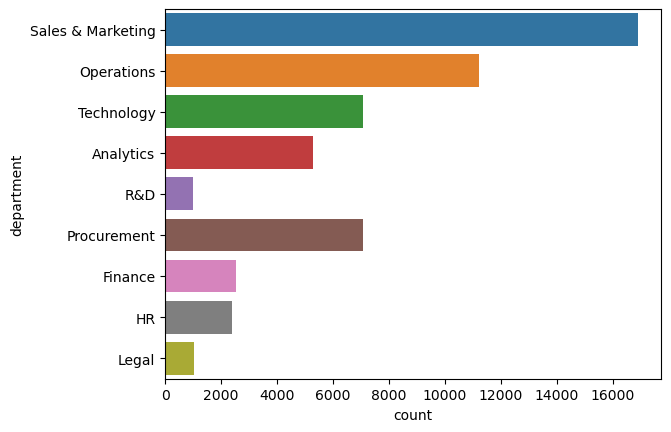

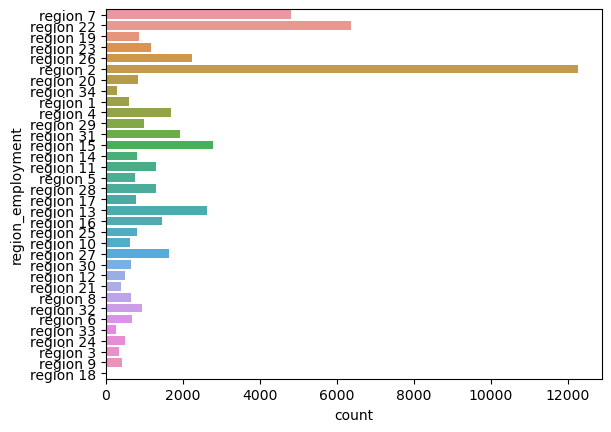

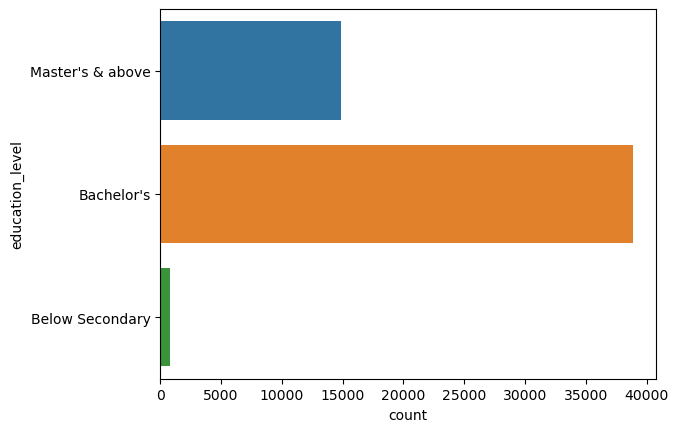

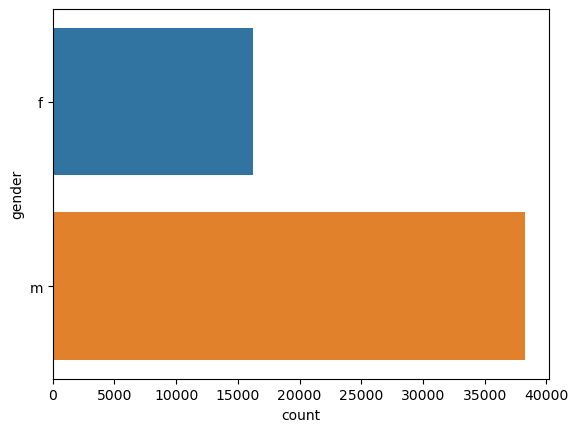

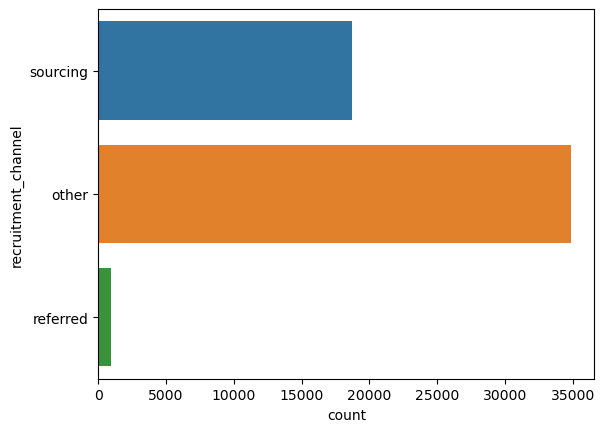

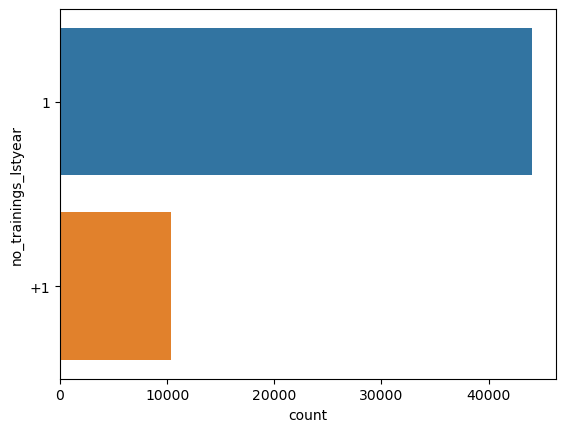

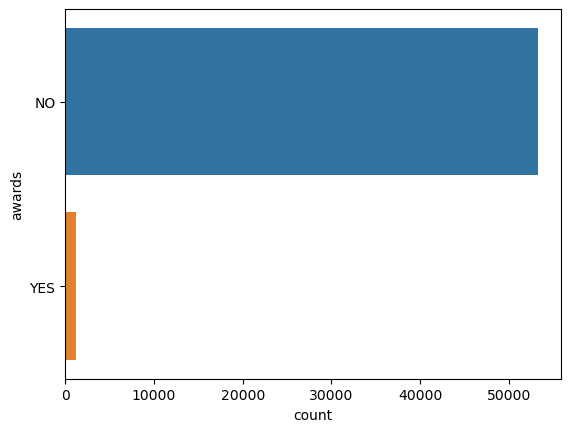

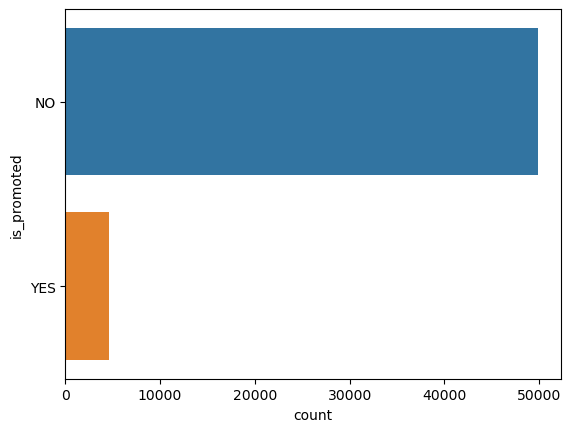

<Figure size 640x480 with 0 Axes>

In [32]:
#data understanding
#univariate analysis
#for categorical features

for i in df.select_dtypes('object').columns :
    sns.countplot(y=df[i])
    plt.figure()

In [33]:
#for numeric features
for i in df.select_dtypes('number').columns:
    print()
    fig=px.histogram(df,i,title=f'{i}',color_discrete_sequence=['blue'],marginal='box',text_auto=True)
    fig.update_layout(title_x=0.5)
    fig.show()
    print("-------------------------------------------------------------------------------")


-------------------------------------------------------------------------------



-------------------------------------------------------------------------------



-------------------------------------------------------------------------------



-------------------------------------------------------------------------------


C:\Users\C.LAB\AppData\Local\Temp\ipykernel_4856\2163637399.py:11: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



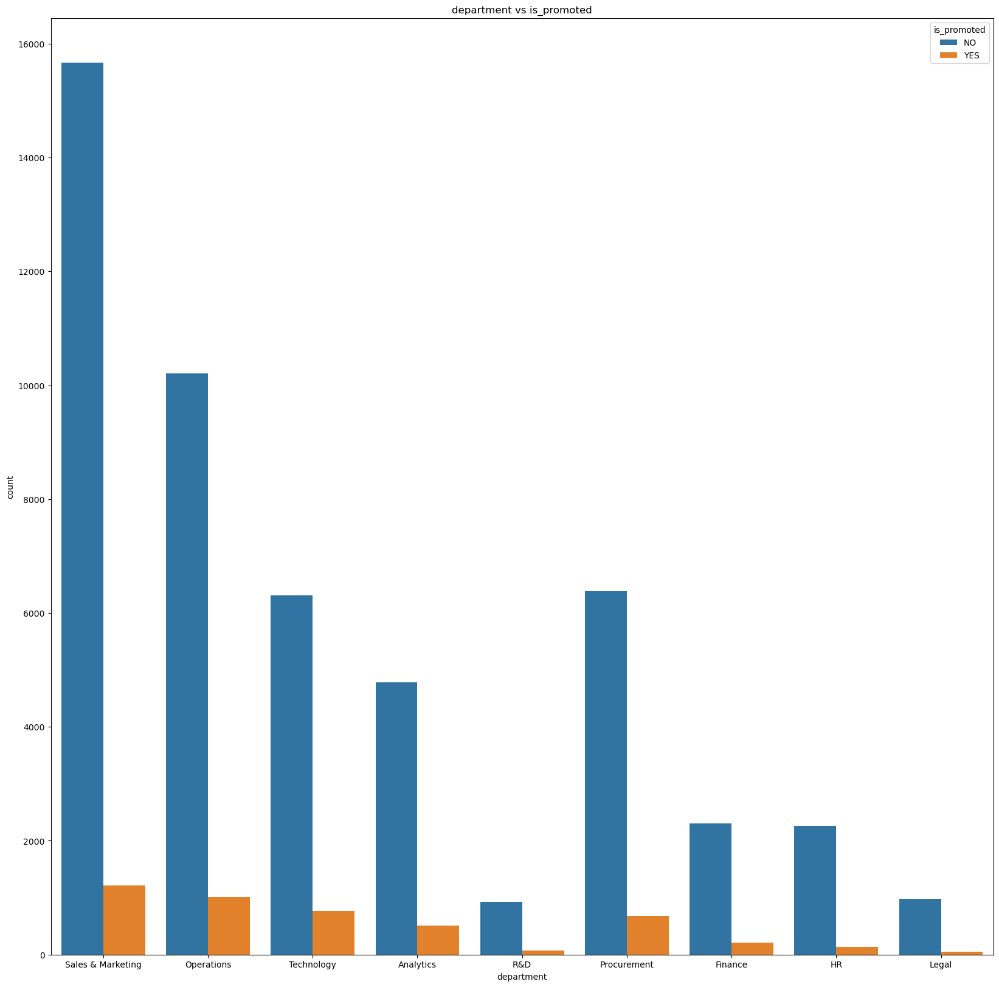

<Figure size 640x480 with 0 Axes>

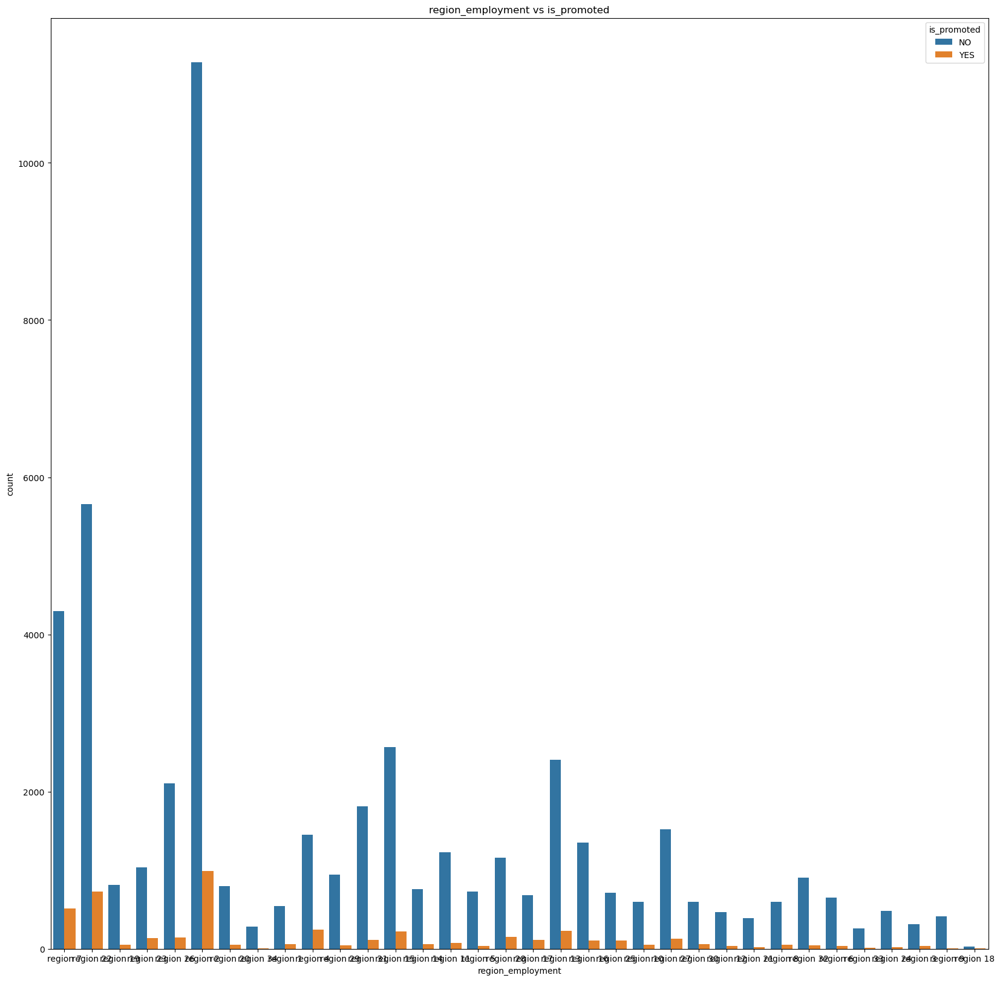

<Figure size 640x480 with 0 Axes>

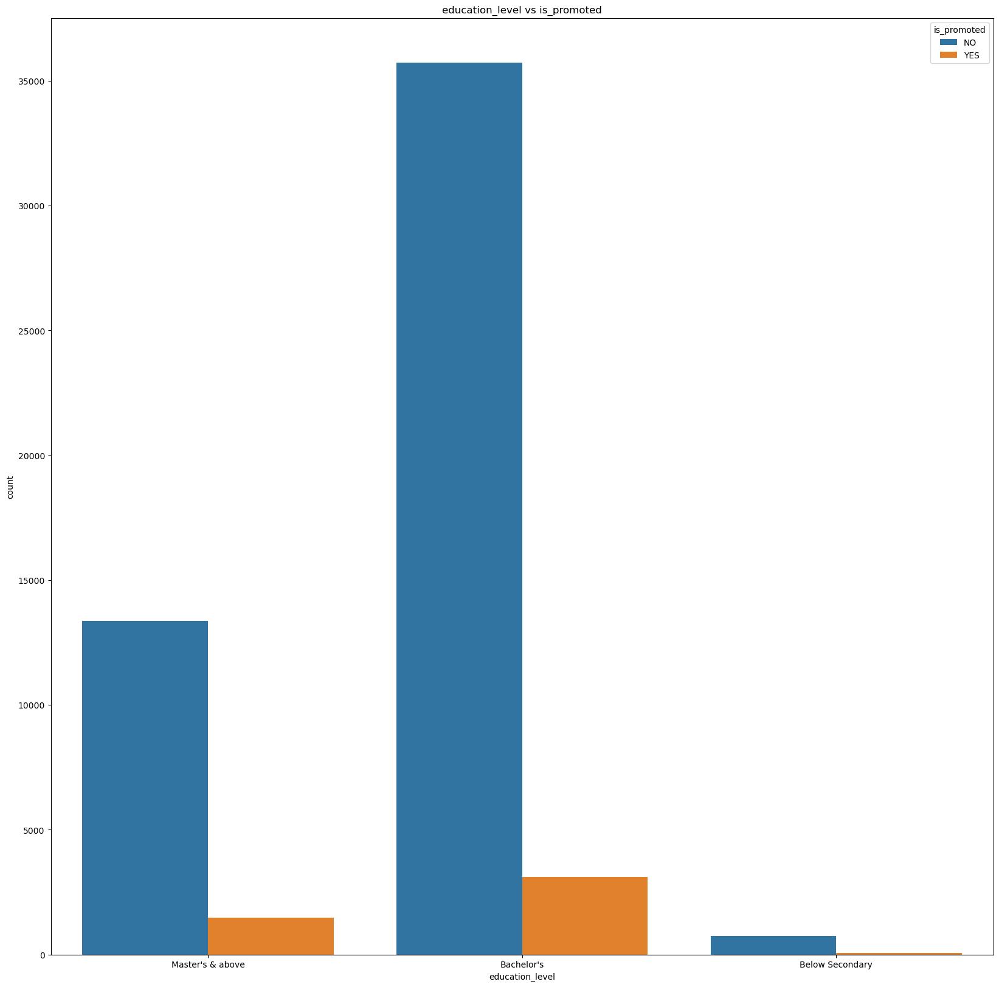

<Figure size 640x480 with 0 Axes>

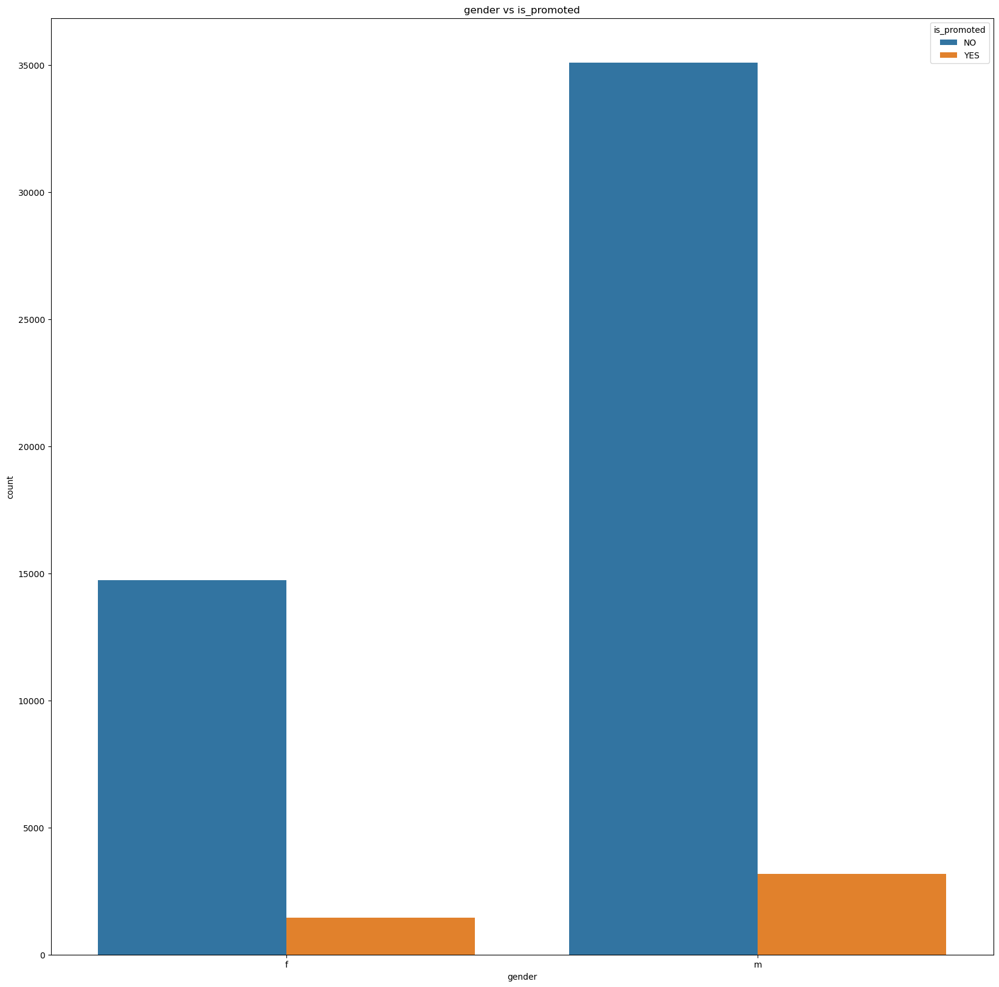

<Figure size 640x480 with 0 Axes>

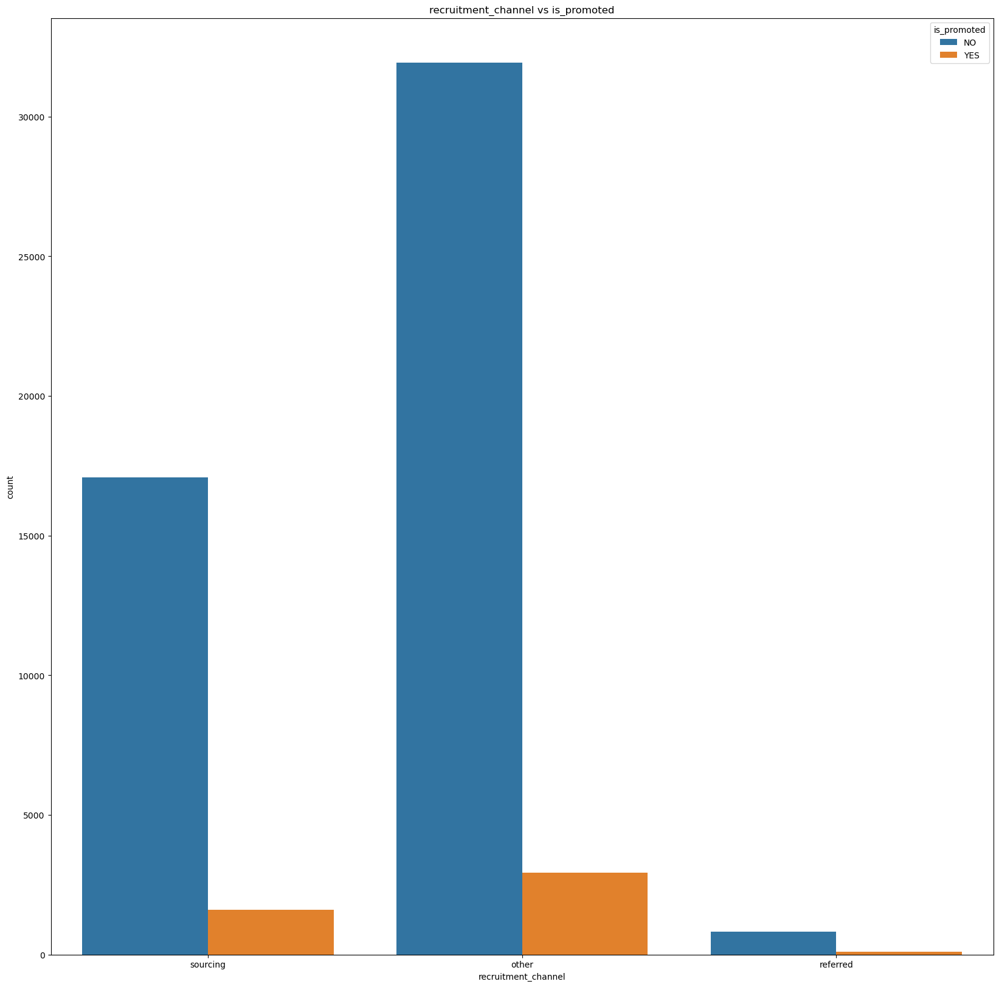

<Figure size 640x480 with 0 Axes>

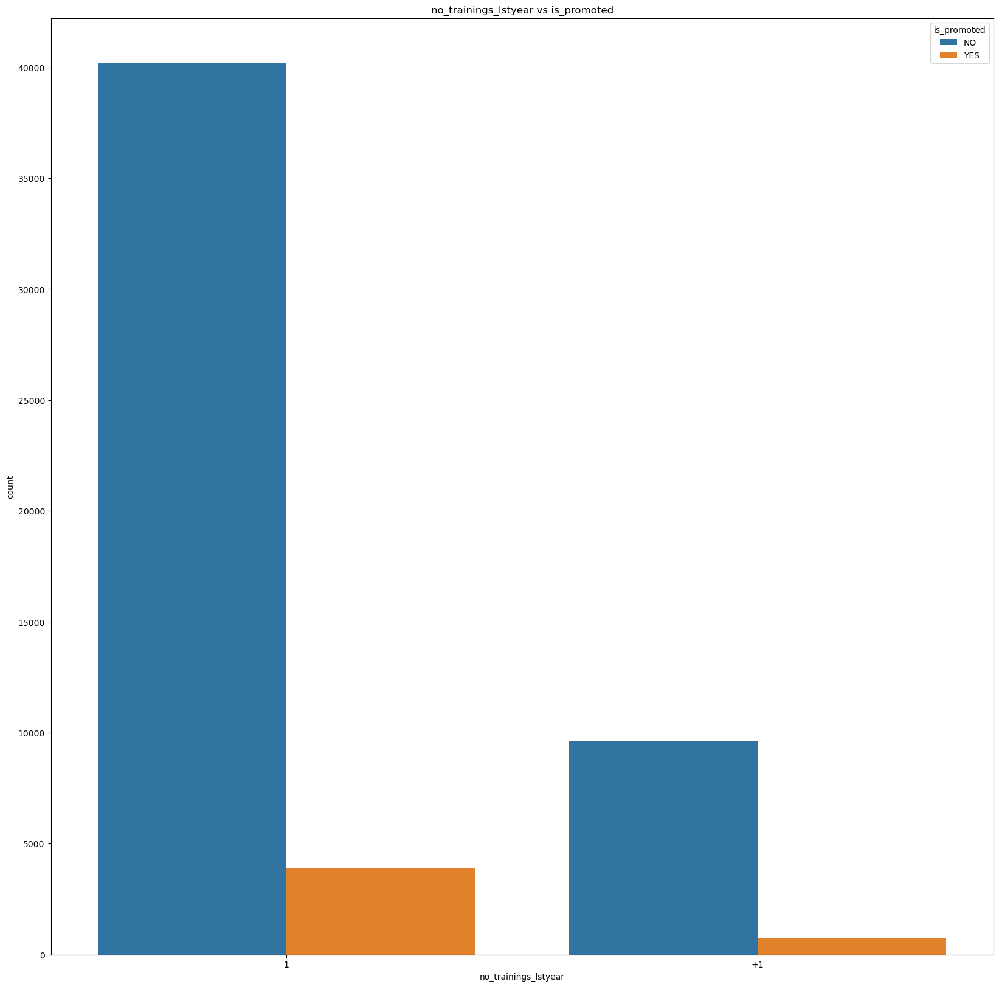

<Figure size 640x480 with 0 Axes>

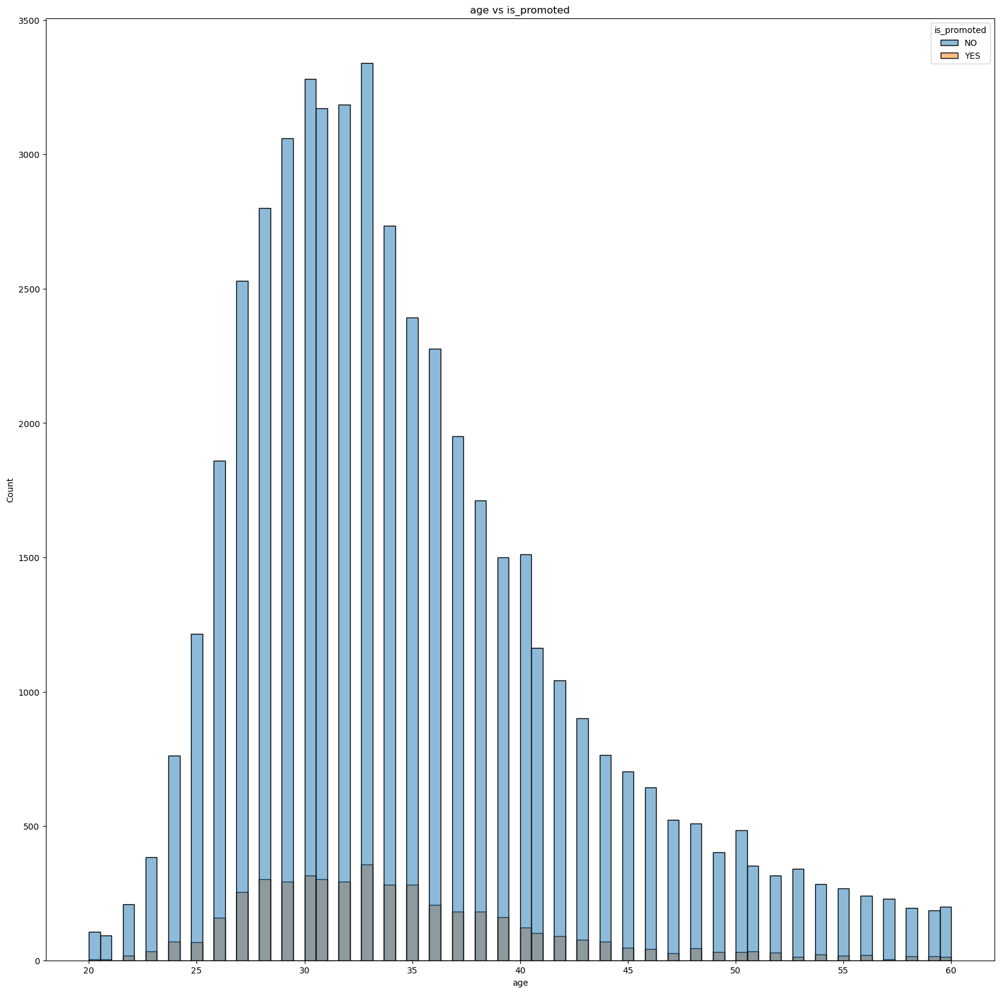

<Figure size 640x480 with 0 Axes>

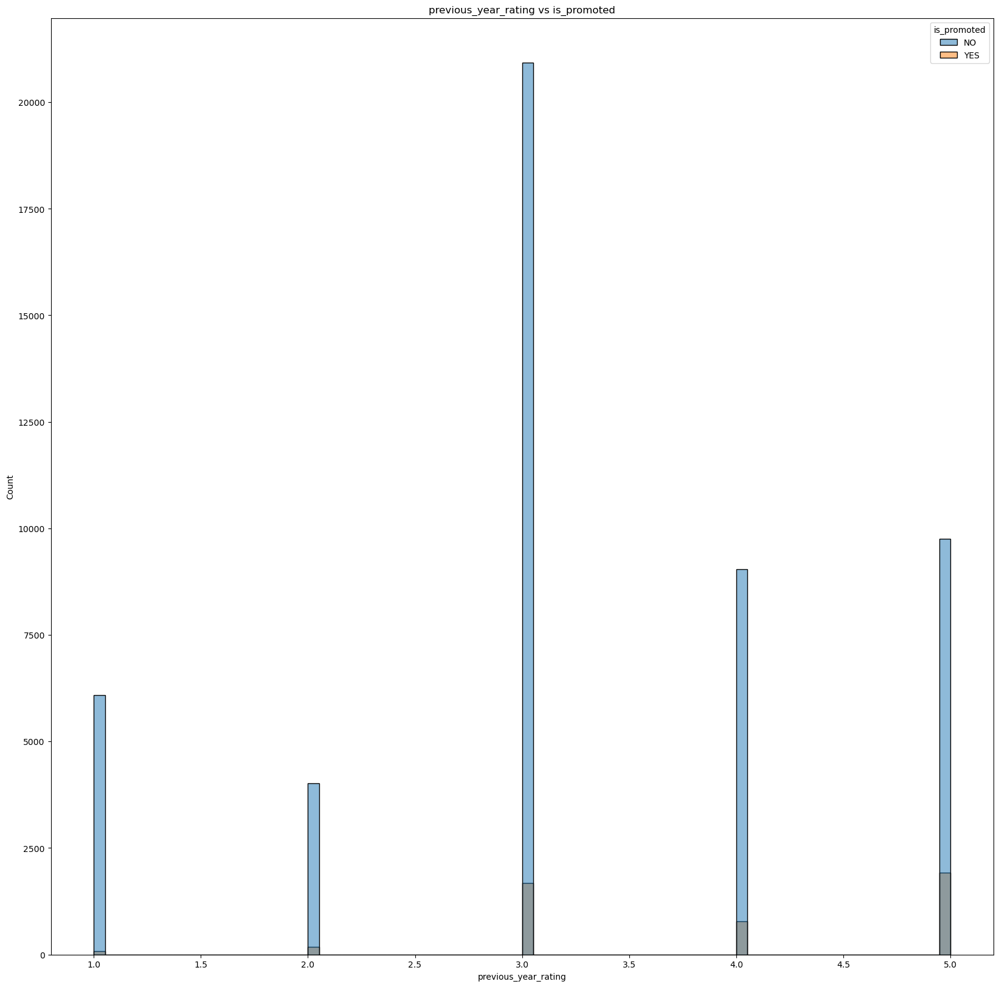

<Figure size 640x480 with 0 Axes>

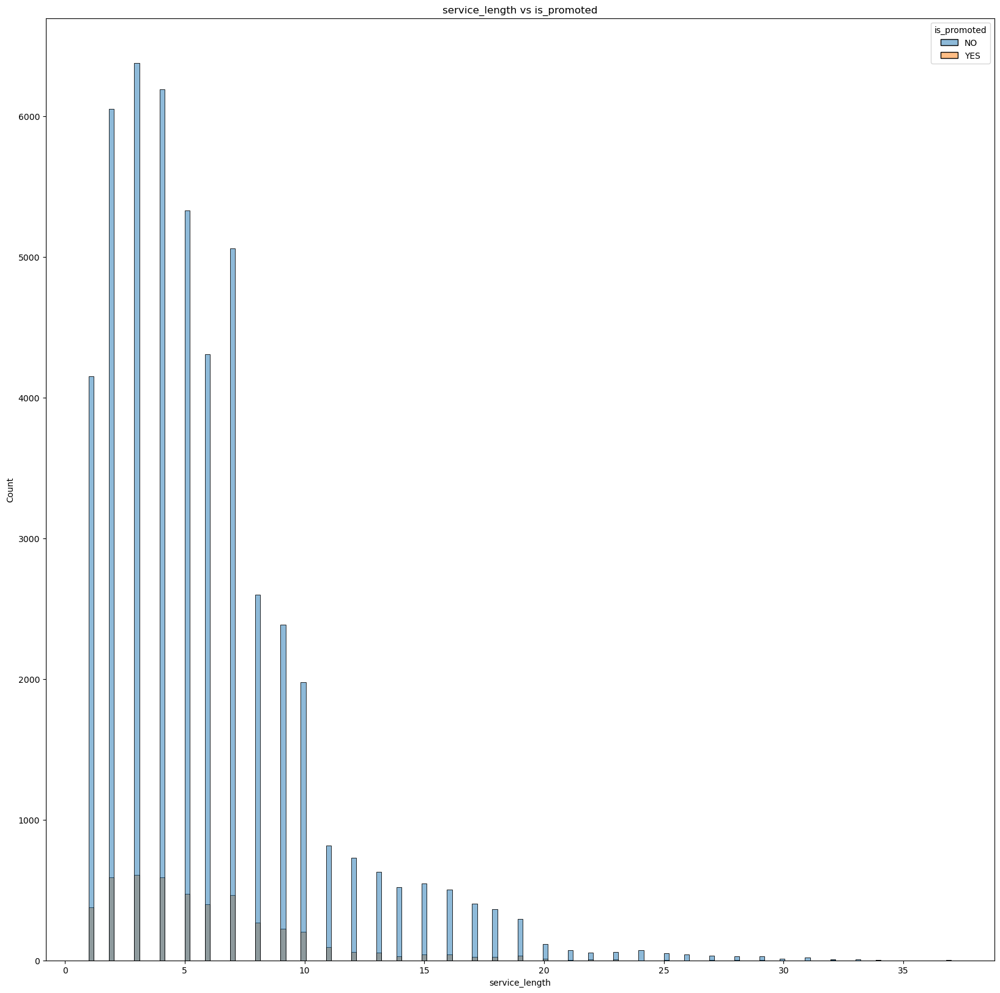

<Figure size 640x480 with 0 Axes>

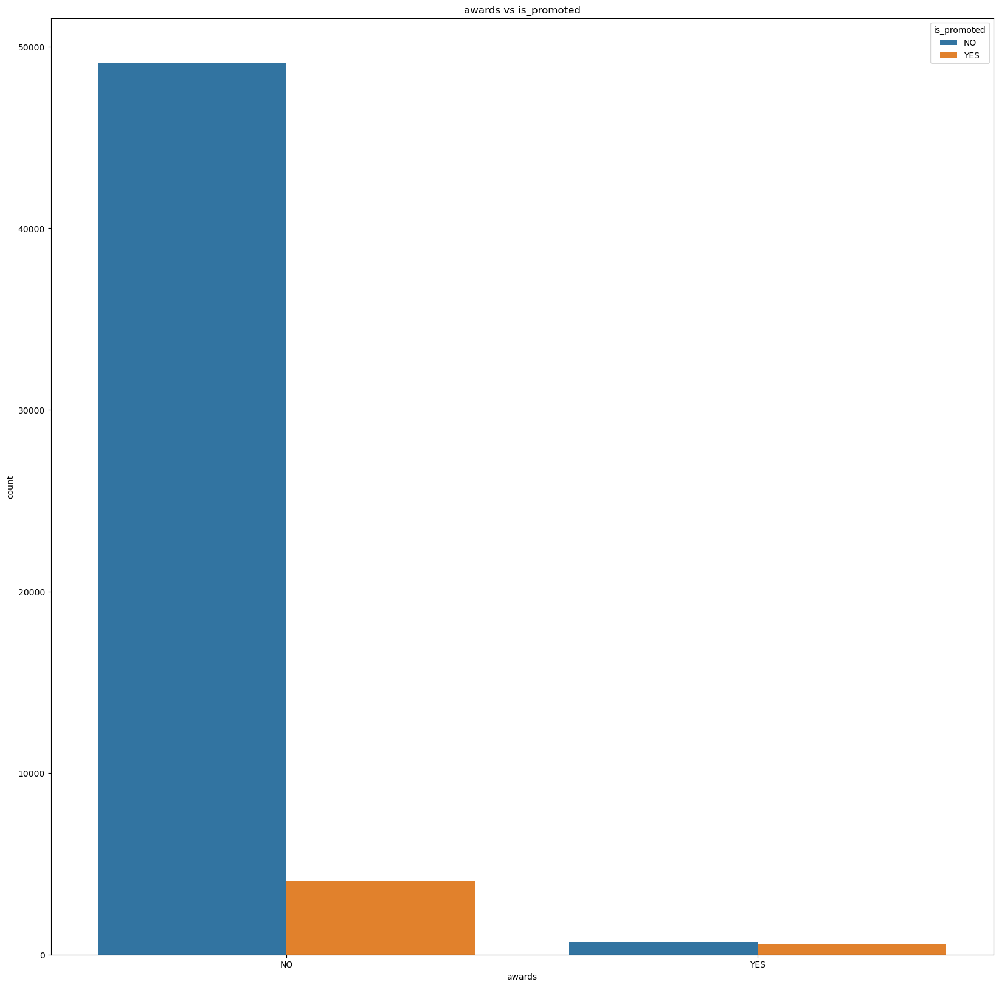

<Figure size 640x480 with 0 Axes>

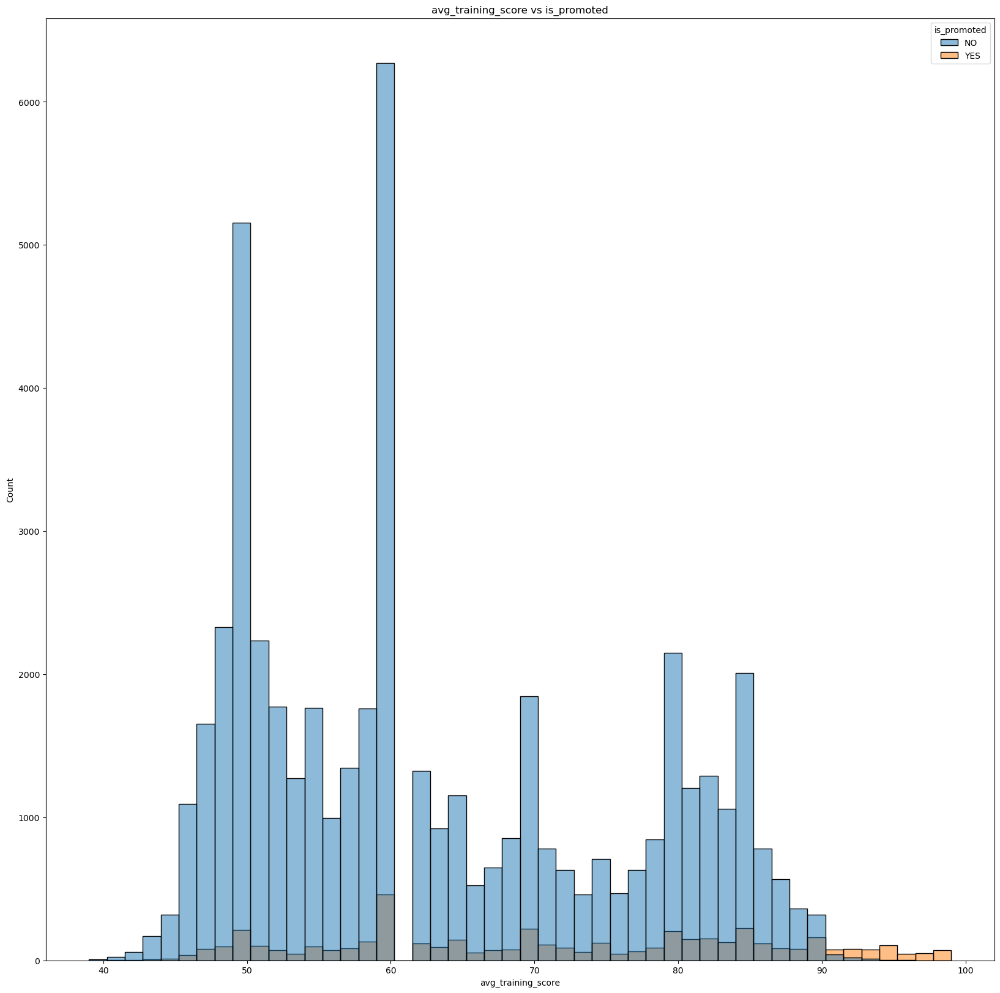

<Figure size 640x480 with 0 Axes>

In [34]:
#bivaraite analysis
for i in df.columns :
    if i == 'is_promoted':
        continue
    else :    
        if df[i].dtypes == 'object':
            plt.figure(figsize=(20 , 20))
            sns.countplot(data=df,x=f'{i}',hue='is_promoted').set(title=f'{i} vs is_promoted')
            plt.figure()
        else :
            plt.figure(figsize=(20 , 20))
            sns.histplot(data=df,x=f'{i}',hue='is_promoted').set(title=f'{i} vs is_promoted')
            plt.figure()

In [35]:
#age vs service lenght per promotion
px.scatter(df,x='age',y='service_length',color='is_promoted')

In [36]:
#age vs training avg score per promotion
px.scatter(df,x='age',y='avg_training_score',color='is_promoted')

<AxesSubplot:>

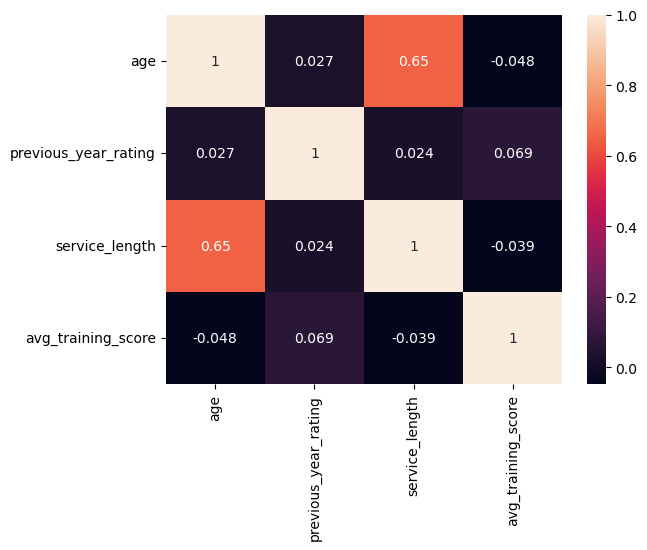

In [37]:
#correlation
sns.heatmap(df.select_dtypes('number').corr(), annot=True )

In [38]:
#encoding
#work with categorical data 
#check and decide the encoding stategy
#update objects list
lst_obj=[]
for i in df.select_dtypes('object') :
    lst_obj.append(i)
for i in lst_obj:
    print(f"for feature {i} : ",df[i].nunique())
    print()

for feature department :  9

for feature region_employment :  34

for feature education_level :  3

for feature gender :  2

for feature recruitment_channel :  3

for feature no_trainings_lstyear :  2

for feature awards :  2

for feature is_promoted :  2



In [39]:
df_c=df.copy()
df_c.isna().sum()

department              0
region_employment       0
education_level         0
gender                  0
recruitment_channel     0
no_trainings_lstyear    0
age                     0
previous_year_rating    0
service_length          0
awards                  0
avg_training_score      0
is_promoted             0
dtype: int64

In [40]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54468 entries, 0 to 54467
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   department            54468 non-null  object 
 1   region_employment     54468 non-null  object 
 2   education_level       54468 non-null  object 
 3   gender                54468 non-null  object 
 4   recruitment_channel   54468 non-null  object 
 5   no_trainings_lstyear  54468 non-null  object 
 6   age                   54468 non-null  int32  
 7   previous_year_rating  54468 non-null  int32  
 8   service_length        54468 non-null  int64  
 9   awards                54468 non-null  object 
 10  avg_training_score    54468 non-null  float64
 11  is_promoted           54468 non-null  object 
dtypes: float64(1), int32(2), int64(1), object(8)
memory usage: 4.6+ MB


In [41]:
#collect object features
lst_obj=[]
for i in df.select_dtypes('object').columns:
    lst_obj.append(i)
lst_obj    

['department',
 'region_employment',
 'education_level',
 'gender',
 'recruitment_channel',
 'no_trainings_lstyear',
 'awards',
 'is_promoted']

In [42]:
#work with ordinal
#target feature
df_c['is_promoted'].unique()

array(['NO', 'YES'], dtype=object)

In [43]:
dic={
    'YES' : 1 ,
    'NO'  : 0
    
}
df_c['is_promoted']=df_c['is_promoted'].map(dic)
df_c['is_promoted'].unique()

array([0, 1], dtype=int64)

In [44]:
df_c['education_level'].unique()

array(["Master's & above", "Bachelor's", 'Below Secondary'], dtype=object)

In [45]:
dic={
    'Below Secondary' : 0,
    "Bachelor's" : 1 ,
    "Master's & above" : 2 
}
df_c['education_level']=df_c['education_level'].map(dic)

In [46]:
#work with nominal
#one hot encoding
lst_small=['gender','recruitment_channel','no_trainings_lstyear','awards']
#create one hot enconding object
ohe = OneHotEncoder(sparse=False)
df_ohe = pd.DataFrame(ohe.fit_transform(df_c[lst_small]) , columns=ohe.get_feature_names_out())
df_ohe

,gender_f,gender_m,recruitment_channel_other,recruitment_channel_referred,recruitment_channel_sourcing,no_trainings_lstyear_+1,no_trainings_lstyear_1,awards_NO,awards_YES
0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
1,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0
2,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
3,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
4,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...
54463,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
54464,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
54465,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0
54466,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0


In [47]:
from category_encoders import BinaryEncoder
#work with nominal
#binary encoding
lst_big=['department','region_employment']
#create binary encoding object
be = BinaryEncoder()
df_be = be.fit_transform(df[lst_big])
df_be

,department_0,department_1,department_2,department_3,region_employment_0,region_employment_1,region_employment_2,region_employment_3,region_employment_4,region_employment_5
0,0,0,0,1,0,0,0,0,0,1
1,0,0,1,0,0,0,0,0,1,0
2,0,0,0,1,0,0,0,0,1,1
3,0,0,0,1,0,0,0,1,0,0
4,0,0,1,1,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...
54463,0,0,0,1,0,0,1,1,1,0
54464,0,0,1,1,0,0,1,1,1,0
54465,0,0,1,0,0,1,0,1,1,1
54466,0,0,0,1,1,0,0,0,0,1


In [48]:
df_c=pd.concat([df_c,df_ohe,df_be],axis=1)
df_c.drop(lst_small + lst_big ,axis=1,inplace=True)
df_c

,education_level,age,previous_year_rating,service_length,avg_training_score,is_promoted,gender_f,gender_m,recruitment_channel_other,recruitment_channel_referred,...,department_0,department_1,department_2,department_3,region_employment_0,region_employment_1,region_employment_2,region_employment_3,region_employment_4,region_employment_5
0,2,35,5,8,49.0,0,1.0,0.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,1
1,1,30,5,4,60.0,0,0.0,1.0,1.0,0.0,...,0,0,1,0,0,0,0,0,1,0
2,1,34,3,7,50.0,0,0.0,1.0,0.0,0.0,...,0,0,0,1,0,0,0,0,1,1
3,1,39,1,10,50.0,0,0.0,1.0,1.0,0.0,...,0,0,0,1,0,0,0,1,0,0
4,1,45,3,2,73.0,0,0.0,1.0,1.0,0.0,...,0,0,1,1,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54463,1,31,1,2,49.0,0,0.0,1.0,1.0,0.0,...,0,0,0,1,0,0,1,1,1,0
54464,1,48,3,17,78.0,0,0.0,1.0,0.0,0.0,...,0,0,1,1,0,0,1,1,1,0
54465,2,37,2,6,56.0,0,1.0,0.0,1.0,0.0,...,0,0,1,0,0,1,0,1,1,1
54466,1,29,1,2,60.0,0,0.0,1.0,0.0,0.0,...,0,0,0,1,1,0,0,0,0,1


In [49]:
#check if there are no categorical data left
lst_obj_c=[]
for i in df_c.columns:
    if df_c[i].dtype == 'O':
        lst_obj_c.append(i)
print(lst_obj_c)  
if len(lst_obj_c) == 0 :
    print('There is no categorical data left')
else :
    print('There is categorical data left') 


[]
There is no categorical data left


In [50]:
#split data
x , y = df_c.drop(['is_promoted'] , axis = 1 ) , df_c['is_promoted']
x_train , x_test , y_train , y_test = train_test_split(x , y , test_size=0.15 , random_state=7 , stratify=y)

In [51]:
x_train

,education_level,age,previous_year_rating,service_length,avg_training_score,gender_f,gender_m,recruitment_channel_other,recruitment_channel_referred,recruitment_channel_sourcing,...,department_0,department_1,department_2,department_3,region_employment_0,region_employment_1,region_employment_2,region_employment_3,region_employment_4,region_employment_5
31239,1,37,1,11,52.0,1.0,0.0,1.0,0.0,0.0,...,0,0,0,1,0,0,0,1,1,0
17724,2,34,4,8,59.0,0.0,1.0,0.0,0.0,1.0,...,0,0,1,0,0,0,0,1,1,0
38598,2,33,4,6,81.0,0.0,1.0,0.0,0.0,1.0,...,0,0,1,1,0,0,0,0,0,1
52149,1,29,3,2,72.0,0.0,1.0,1.0,0.0,0.0,...,0,1,1,0,0,0,1,1,0,0
49462,1,50,5,5,58.0,0.0,1.0,0.0,0.0,1.0,...,0,0,1,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41805,1,53,3,13,80.0,1.0,0.0,1.0,0.0,0.0,...,0,0,1,1,0,0,0,1,1,0
37357,1,31,5,2,59.0,1.0,0.0,1.0,0.0,0.0,...,0,0,1,0,0,1,1,1,0,1
28648,2,38,5,6,90.0,0.0,1.0,1.0,0.0,0.0,...,0,0,1,1,0,1,0,0,0,1
5491,1,33,4,3,49.0,1.0,0.0,1.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,1


In [52]:
x_test

,education_level,age,previous_year_rating,service_length,avg_training_score,gender_f,gender_m,recruitment_channel_other,recruitment_channel_referred,recruitment_channel_sourcing,...,department_0,department_1,department_2,department_3,region_employment_0,region_employment_1,region_employment_2,region_employment_3,region_employment_4,region_employment_5
13640,1,25,5,2,57.0,0.0,1.0,0.0,0.0,1.0,...,0,0,1,0,0,0,0,1,1,0
15657,1,33,5,6,59.0,1.0,0.0,1.0,0.0,0.0,...,0,0,1,0,0,1,0,1,0,0
16357,1,24,1,2,51.0,1.0,0.0,1.0,0.0,0.0,...,0,0,0,1,0,0,0,0,1,0
12486,1,38,5,9,80.0,1.0,0.0,1.0,0.0,0.0,...,0,0,1,1,0,0,0,1,1,0
14037,1,27,3,1,59.0,1.0,0.0,1.0,0.0,0.0,...,0,0,1,0,0,1,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40616,1,27,5,2,78.0,0.0,1.0,0.0,0.0,1.0,...,0,1,0,1,0,0,0,0,1,0
53539,1,34,4,6,49.0,0.0,1.0,1.0,0.0,0.0,...,0,0,0,1,0,0,0,1,0,0
6925,1,32,3,8,86.0,1.0,0.0,1.0,0.0,0.0,...,0,1,0,0,0,1,1,1,0,1
21832,1,29,5,2,83.0,0.0,1.0,0.0,0.0,1.0,...,0,1,1,0,0,0,0,1,1,0


In [53]:
y_train

31239    0
17724    0
38598    0
52149    0
49462    0
        ..
41805    0
37357    0
28648    1
5491     0
23974    0
Name: is_promoted, Length: 46297, dtype: int64

In [54]:
y_test

13640    0
15657    0
16357    0
12486    0
14037    0
        ..
40616    0
53539    0
6925     0
21832    1
45888    0
Name: is_promoted, Length: 8171, dtype: int64

In [55]:
#minimax scaling
#create minmax scaler object
scaler = MinMaxScaler()
x_train[x_train.columns] = scaler.fit_transform(x_train)
x_test[x_test.columns] = scaler.transform(x_test)

In [56]:
#check the imbalancing classes of the target
print(y_train.value_counts(),'\n')
px.pie(y_train,names=y_train)

0    42354
1     3943
Name: is_promoted, dtype: int64 



In [57]:
#handle imbalanced classes with smote sampling
#create smote smapling object
sm = SMOTE(sampling_strategy={1 : 45_000})

In [58]:
#resampling
x_train , y_train= sm.fit_resample(x_train , y_train)

In [59]:
#check again for balancing
print(y_train.value_counts(),'\n')
px.pie(y_train,names=y_train)

1    45000
0    42354
Name: is_promoted, dtype: int64 



In [60]:
#modeling ---> donot forget to scale before modeling
#leave paramters of models by default
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
Models = [
    ('LR',LogisticRegression()),
    ('MNB' , MultinomialNB()),
    ('BNB' ,BernoulliNB()),
    ('GNB',GaussianNB()),
    ('KNNC' , KNeighborsClassifier()),
    #('SVC' , SVC()),
    ('DT' , DecisionTreeClassifier()),
    ('RF' , RandomForestClassifier()),
    ('ADB',AdaBoostClassifier()),
    ('GB',GradientBoostingClassifier()),
    ('XGB',xgb.XGBClassifier())
]

LR
Training set pred accuracy :  68.0 %
Test set  pred accuracy :  67.0 %
              precision    recall  f1-score   support

          No     0.6744    0.6636    0.6690     42354
         Yes     0.6881    0.6985    0.6933     45000

    accuracy                         0.6816     87354
   macro avg     0.6813    0.6811    0.6811     87354
weighted avg     0.6815    0.6816    0.6815     87354

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9555    0.6748    0.7910      7475
         Yes     0.1594    0.6624    0.2570       696

    accuracy                         0.6737      8171
   macro avg     0.5574    0.6686    0.5240      8171
weighted avg     0.8877    0.6737    0.7455      8171

Classification report for test set : 
 None
matrix for train : 



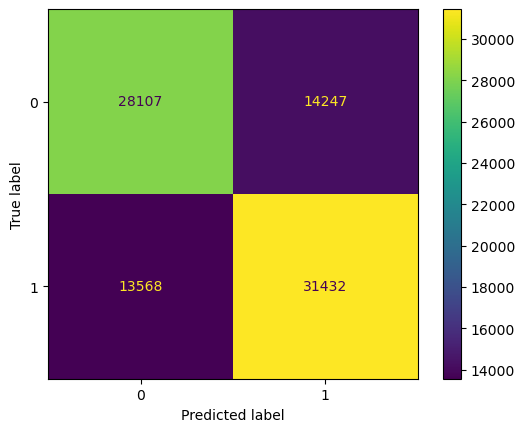

matrix for test : 



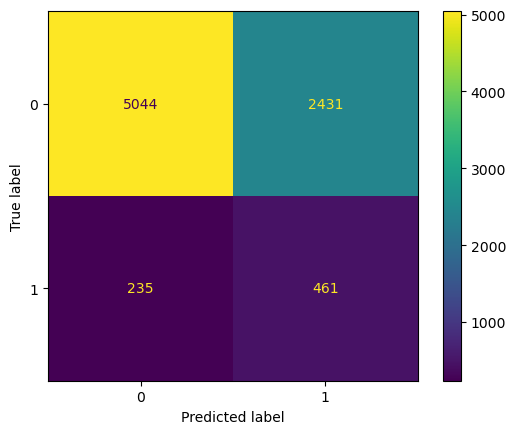

------------------------------
MNB
Training set pred accuracy :  62.0 %
Test set  pred accuracy :  61.0 %
              precision    recall  f1-score   support

          No     0.6009    0.6133    0.6070     42354
         Yes     0.6288    0.6166    0.6227     45000

    accuracy                         0.6150     87354
   macro avg     0.6149    0.6150    0.6148     87354
weighted avg     0.6153    0.6150    0.6151     87354

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9437    0.6140    0.7440      7475
         Yes     0.1276    0.6063    0.2108       696

    accuracy                         0.6134      8171
   macro avg     0.5356    0.6102    0.4774      8171
weighted avg     0.8742    0.6134    0.6986      8171

Classification report for test set : 
 None
matrix for train : 



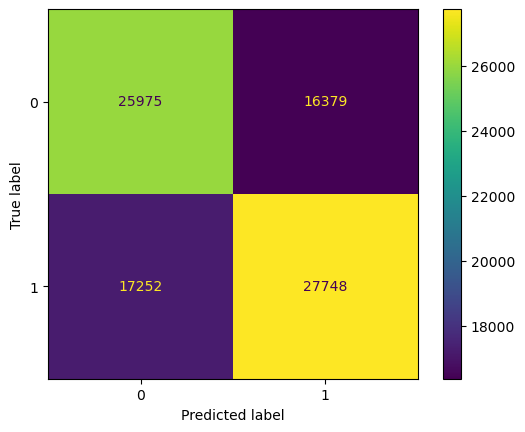

matrix for test : 



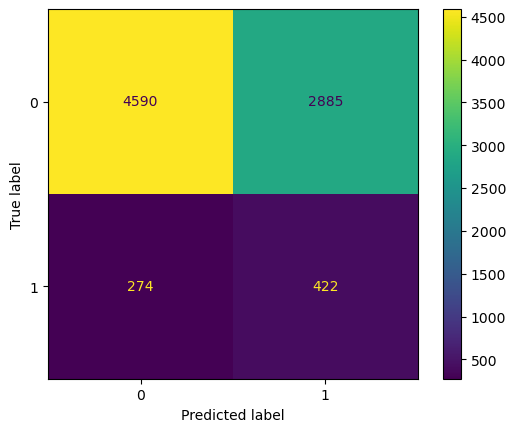

------------------------------
BNB
Training set pred accuracy :  60.0 %
Test set  pred accuracy :  56.99999999999999 %
              precision    recall  f1-score   support

          No     0.5926    0.5683    0.5802     42354
         Yes     0.6088    0.6323    0.6203     45000

    accuracy                         0.6013     87354
   macro avg     0.6007    0.6003    0.6002     87354
weighted avg     0.6009    0.6013    0.6009     87354

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9361    0.5668    0.7061      7475
         Yes     0.1117    0.5848    0.1875       696

    accuracy                         0.5684      8171
   macro avg     0.5239    0.5758    0.4468      8171
weighted avg     0.8659    0.5684    0.6619      8171

Classification report for test set : 
 None
matrix for train : 



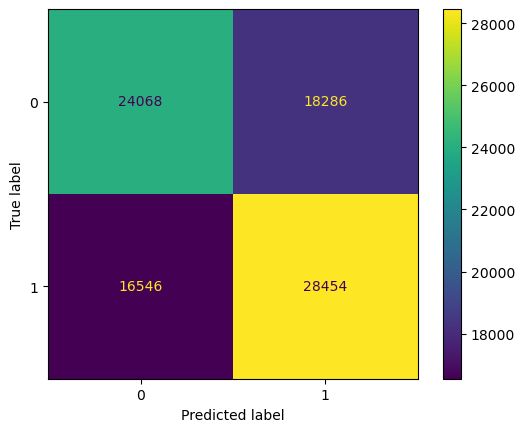

matrix for test : 



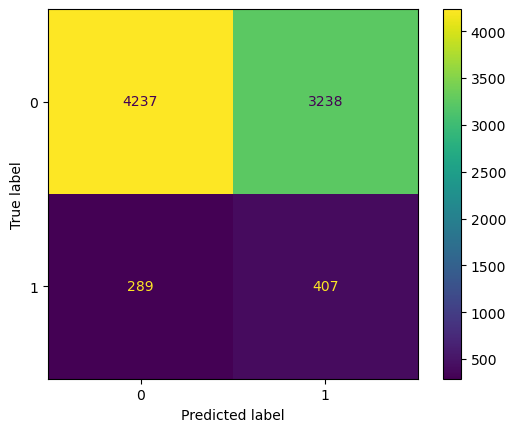

------------------------------
GNB
Training set pred accuracy :  62.0 %
Test set  pred accuracy :  86.0 %
              precision    recall  f1-score   support

          No     0.5721    0.8943    0.6978     42354
         Yes     0.7882    0.3704    0.5040     45000

    accuracy                         0.6244     87354
   macro avg     0.6801    0.6323    0.6009     87354
weighted avg     0.6834    0.6244    0.5979     87354

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9360    0.9046    0.9201      7475
         Yes     0.2471    0.3362    0.2848       696

    accuracy                         0.8562      8171
   macro avg     0.5916    0.6204    0.6025      8171
weighted avg     0.8774    0.8562    0.8660      8171

Classification report for test set : 
 None
matrix for train : 



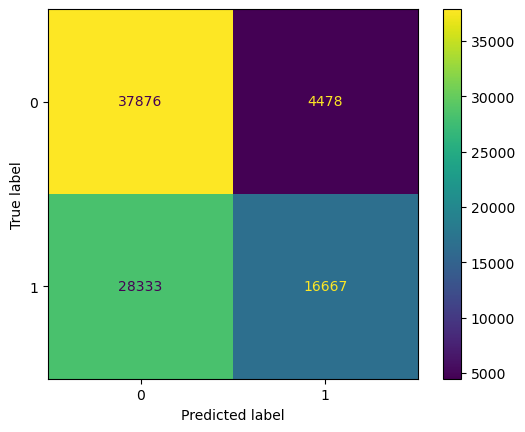

matrix for test : 



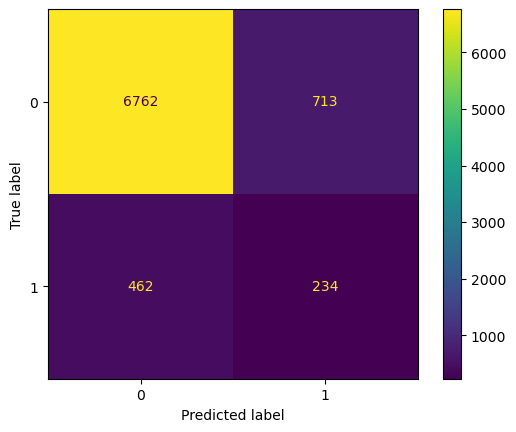

------------------------------


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning:

Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.



KNNC
Training set pred accuracy :  93.0 %
Test set  pred accuracy :  78.0 %
              precision    recall  f1-score   support

          No     0.9784    0.8745    0.9236     42354
         Yes     0.8926    0.9818    0.9351     45000

    accuracy                         0.9298     87354
   macro avg     0.9355    0.9282    0.9293     87354
weighted avg     0.9342    0.9298    0.9295     87354

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9381    0.8174    0.8736      7475
         Yes     0.1767    0.4210    0.2489       696

    accuracy                         0.7836      8171
   macro avg     0.5574    0.6192    0.5613      8171
weighted avg     0.8733    0.7836    0.8204      8171

Classification report for test set : 
 None
matrix for train : 



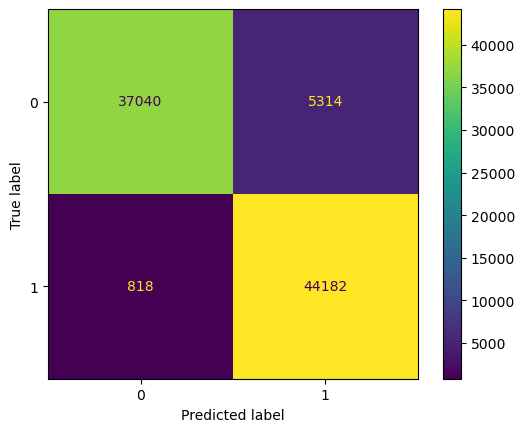

matrix for test : 



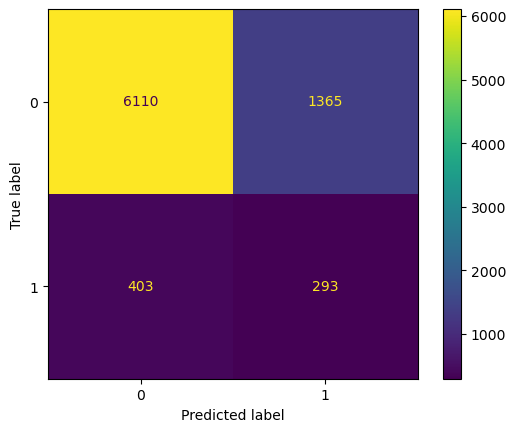

------------------------------
DT
Training set pred accuracy :  100.0 %
Test set  pred accuracy :  87.0 %
              precision    recall  f1-score   support

          No     0.9992    1.0000    0.9996     42354
         Yes     1.0000    0.9992    0.9996     45000

    accuracy                         0.9996     87354
   macro avg     0.9996    0.9996    0.9996     87354
weighted avg     0.9996    0.9996    0.9996     87354

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9379    0.9191    0.9284      7475
         Yes     0.2849    0.3463    0.3126       696

    accuracy                         0.8703      8171
   macro avg     0.6114    0.6327    0.6205      8171
weighted avg     0.8823    0.8703    0.8759      8171

Classification report for test set : 
 None
matrix for train : 



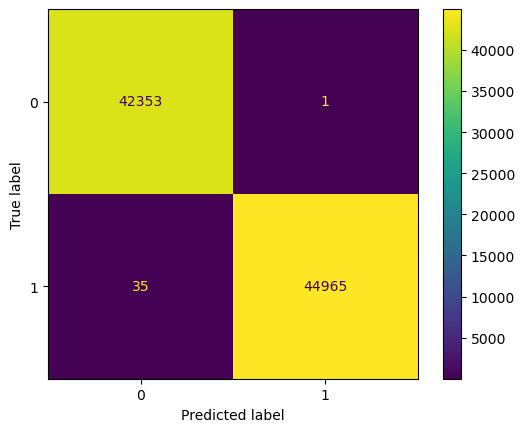

matrix for test : 



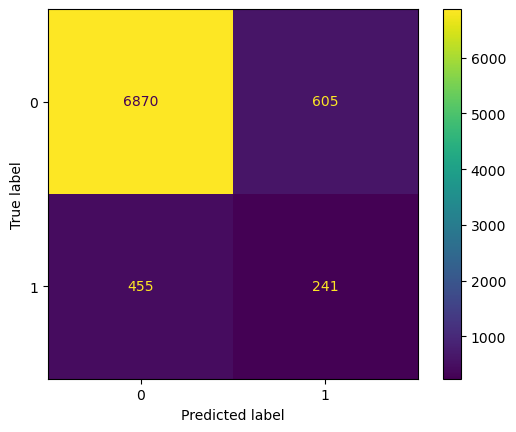

------------------------------
RF
Training set pred accuracy :  100.0 %
Test set  pred accuracy :  92.0 %
              precision    recall  f1-score   support

          No     0.9994    0.9997    0.9996     42354
         Yes     0.9997    0.9995    0.9996     45000

    accuracy                         0.9996     87354
   macro avg     0.9996    0.9996    0.9996     87354
weighted avg     0.9996    0.9996    0.9996     87354

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9384    0.9714    0.9546      7475
         Yes     0.5058    0.3147    0.3880       696

    accuracy                         0.9154      8171
   macro avg     0.7221    0.6430    0.6713      8171
weighted avg     0.9015    0.9154    0.9063      8171

Classification report for test set : 
 None
matrix for train : 



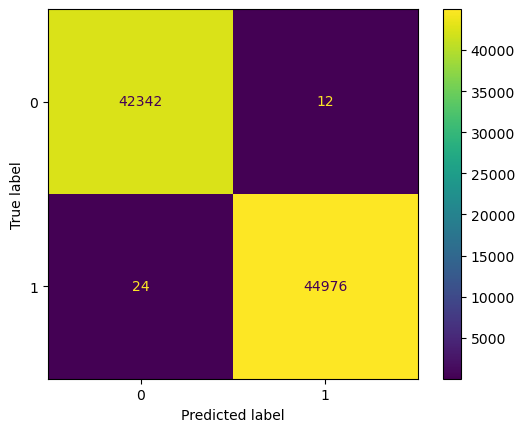

matrix for test : 



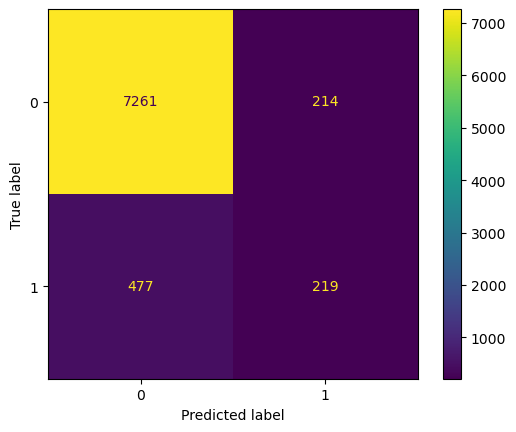

------------------------------
ADB
Training set pred accuracy :  83.0 %
Test set  pred accuracy :  81.0 %
              precision    recall  f1-score   support

          No     0.8162    0.8341    0.8250     42354
         Yes     0.8406    0.8232    0.8318     45000

    accuracy                         0.8285     87354
   macro avg     0.8284    0.8286    0.8284     87354
weighted avg     0.8287    0.8285    0.8285     87354

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9466    0.8424    0.8915      7475
         Yes     0.2245    0.4899    0.3079       696

    accuracy                         0.8124      8171
   macro avg     0.5856    0.6662    0.5997      8171
weighted avg     0.8851    0.8124    0.8418      8171

Classification report for test set : 
 None
matrix for train : 



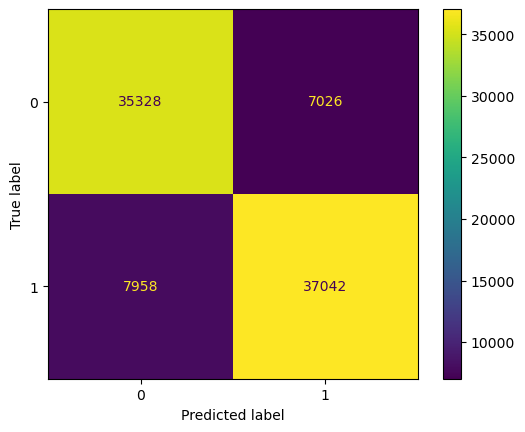

matrix for test : 



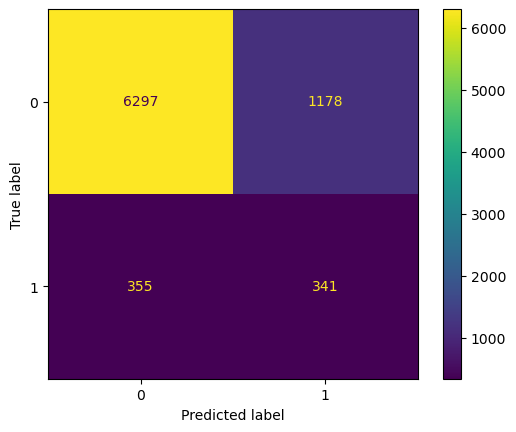

------------------------------
GB
Training set pred accuracy :  92.0 %
Test set  pred accuracy :  90.0 %
              precision    recall  f1-score   support

          No     0.8889    0.9553    0.9209     42354
         Yes     0.9548    0.8876    0.9199     45000

    accuracy                         0.9204     87354
   macro avg     0.9218    0.9215    0.9204     87354
weighted avg     0.9228    0.9204    0.9204     87354

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9374    0.9571    0.9471      7475
         Yes     0.4045    0.3132    0.3530       696

    accuracy                         0.9022      8171
   macro avg     0.6709    0.6351    0.6501      8171
weighted avg     0.8920    0.9022    0.8965      8171

Classification report for test set : 
 None
matrix for train : 



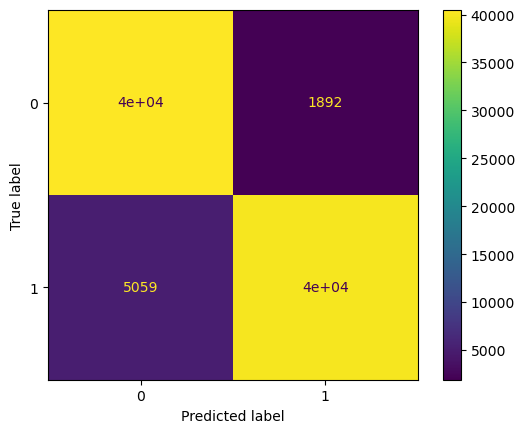

matrix for test : 



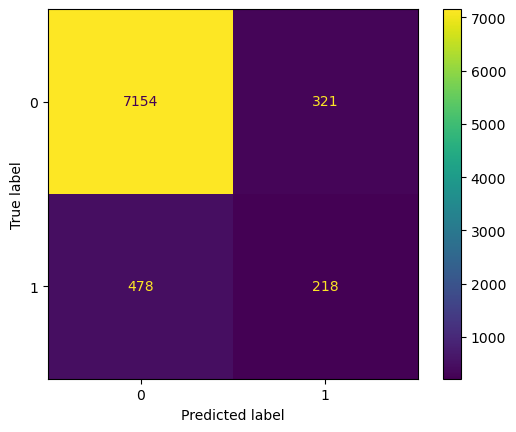

------------------------------
XGB
Training set pred accuracy :  96.0 %
Test set  pred accuracy :  94.0 %
              precision    recall  f1-score   support

          No     0.9342    0.9966    0.9644     42354
         Yes     0.9965    0.9340    0.9642     45000

    accuracy                         0.9643     87354
   macro avg     0.9654    0.9653    0.9643     87354
weighted avg     0.9663    0.9643    0.9643     87354

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9418    0.9937    0.9671      7475
         Yes     0.8345    0.3405    0.4837       696

    accuracy                         0.9381      8171
   macro avg     0.8882    0.6671    0.7254      8171
weighted avg     0.9327    0.9381    0.9259      8171

Classification report for test set : 
 None
matrix for train : 



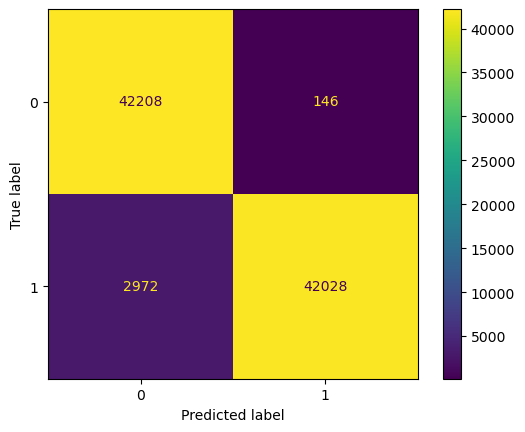

matrix for test : 



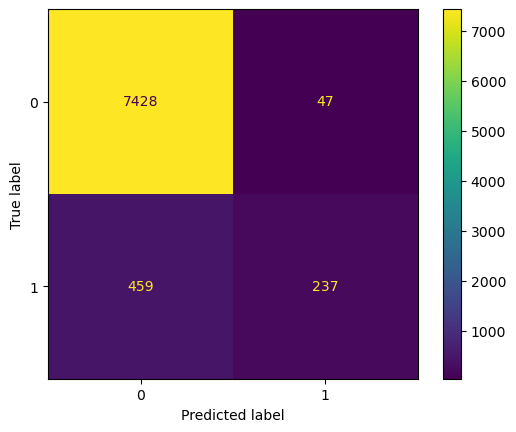

------------------------------


In [61]:
for model in Models:
    
    model[1].fit(x_train , y_train)
    
    y_train_pred = model[1].predict(x_train)
    y_test_pred = model[1].predict(x_test)
    train_acc = accuracy_score(y_true=y_train , y_pred=y_train_pred)
    test_acc = accuracy_score(y_true=y_test , y_pred=y_test_pred)
    print(model[0])
    print("Training set pred accuracy : ",np.around(train_acc,2)* 100,'%' )
    print("Test set  pred accuracy : ",np.around(test_acc,2)* 100,'%')
    print("Classification report for training set : \n",print(classification_report(y_true=y_train, y_pred=y_train_pred, target_names=['No','Yes'], digits=4)))
    print("Classification report for test set : \n",print(classification_report(y_true=y_test, y_pred=y_test_pred, target_names=['No','Yes'], digits=4)))
    print('matrix for train : \n')
    ConfusionMatrixDisplay(confusion_matrix(y_true=y_train , y_pred=y_train_pred)).plot()
    plt.show()
    print('matrix for test : \n')
    ConfusionMatrixDisplay(confusion_matrix(y_true=y_test , y_pred=y_test_pred)).plot()
    plt.show()
    print('-'*30)   

In [65]:
#draw the decision tree
dt=DecisionTreeClassifier(max_depth=3)
dt.fit(x_train , y_train)
plt.figure(figsize=(100 , 100))
_ = plot_tree(dt , filled=True )
plt.show()

Training set pred accuracy :  100.0 %
Test set  pred accuracy :  87.0 %
              precision    recall  f1-score   support

          No     0.9992    1.0000    0.9996     42354
         Yes     1.0000    0.9992    0.9996     45000

    accuracy                         0.9996     87354
   macro avg     0.9996    0.9996    0.9996     87354
weighted avg     0.9996    0.9996    0.9996     87354

Classification report for training set : 
 None
              precision    recall  f1-score   support

          No     0.9384    0.9152    0.9267      7475
         Yes     0.2804    0.3549    0.3133       696

    accuracy                         0.8675      8171
   macro avg     0.6094    0.6350    0.6200      8171
weighted avg     0.8824    0.8675    0.8744      8171

Classification report for test set : 
 None
matrix for train : 



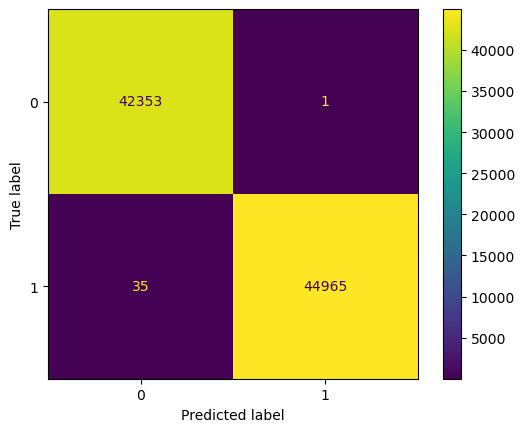

matrix for test : 



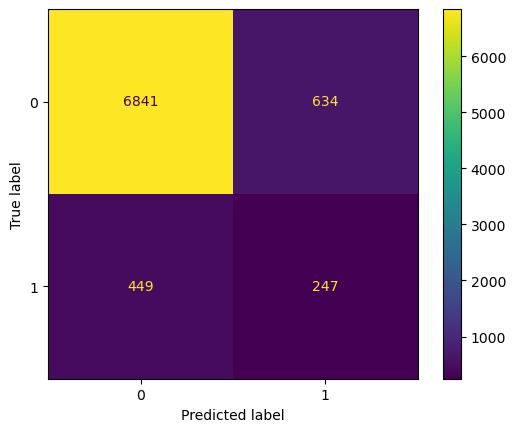

------------------------------


In [67]:
#save and load our model
#we evaluate and choose the best model which is random forest
#save
rf=RandomForestClassifier()
rf.fit(x_train , y_train)
y_train_pred = rf.predict(x_train)
y_test_pred = rf.predict(x_test)
train_acc = accuracy_score(y_true=y_train , y_pred=y_train_pred)
test_acc = accuracy_score(y_true=y_test , y_pred=y_test_pred)
print("Training set pred accuracy : ",np.around(train_acc,2)* 100,'%' )
print("Test set  pred accuracy : ",np.around(test_acc,2)* 100,'%')
print("Classification report for training set : \n",print(classification_report(y_true=y_train, y_pred=y_train_pred, target_names=['No','Yes'], digits=4)))
print("Classification report for test set : \n",print(classification_report(y_true=y_test, y_pred=y_test_pred, target_names=['No','Yes'], digits=4)))    
print('matrix for train : \n')
ConfusionMatrixDisplay(confusion_matrix(y_true=y_train , y_pred=y_train_pred)).plot()
plt.show()
print('matrix for test : \n')
ConfusionMatrixDisplay(confusion_matrix(y_true=y_test , y_pred=y_test_pred)).plot()
plt.show()
print('-'*30)   
import pickle
pickle.dump(dt, open('model.pkl', 'wb'))

In [68]:
#reuse model and predict
#reuse the model
#load the model
pickled_model = pickle.load(open('model.pkl', 'rb'))